#-------------ML 3° APPROACHES------------






##import data

In [1]:
# Step 1: Monta Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Step 2: Importa le librerie necessarie
import pandas as pd

# Step 3: Specifica il percorso del file .dta
file_path = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/dt_completo_04_11_2024_secondo_terzo.csv'# 3 milioni righe TARGET1 0:89% 1:11%->CREARE DT PROPORZIONATO 100K T1 (la target 2 si puo creare )


#file_path='/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/dt_completo_04_11_2024_secondo_terzo_DOWNSAMPLING_16000.csv'
#file_path='/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/dt_completo_04_11_2024_secondo_terzo_PROPORTIONAL_20000.csv'



# Step 4: Carica il file .dta in un DataFrame
df = pd.read_csv(file_path)

# Step 5: Visualizza le prime righe del DataFrame per verificare l'importazione
df




Mounted at /content/drive


,codice,elixsum3,target,DIAGNOSI
0,A000000046193699,1.0,1,"Colostomy status; Fistula of intestine, exclud..."
1,A000000005695721,0.0,0,"Pressure ulcer, lower back; Other functional d..."
2,A000000009356867,2.0,1,Acute respiratory failure; Malignant neoplasm ...
3,A000000035364919,2.0,0,Malignant neoplasm of lateral wall of urinary ...
4,A000000044748792,2.0,0,Malignant neoplasm of prostate; Other pulmonar...
...,...,...,...,...
3456482,A000000047290338,2.0,0,Encounter for antineoplastic chemotherapy; Mal...
3456483,A000000020186108,2.0,0,Malignant neoplasm of ovary; Secondary and uns...
3456484,A000000066182524,0.0,0,Benign neoplasm of cranial nerves; Sensorineur...
3456485,A000000044631506,2.0,0,Malignant neoplasm of descending colon; Malign...


In [ ]:
df.columns

Index(['codice', 'elixsum3', 'target', 'DIAGNOSI'], dtype='object')

##drop the NA's in dpr_long_description

In [2]:
# Rimuovi le righe in cui 'col1' ha valori NaN
#df = df.dropna(subset=['dpr_LONG_DESCRIPTION'])
#df = df.dropna(subset=['dpr_LONG_DESCRIPTION','target'])
# Rimuove le righe dove la colonna 'DIAGNOSI' ha valore NaN
df = df.dropna(subset=['DIAGNOSI', 'target','elixsum3' ])


df

,codice,elixsum3,target,DIAGNOSI
0,A000000046193699,1.0,1,"Colostomy status; Fistula of intestine, exclud..."
1,A000000005695721,0.0,0,"Pressure ulcer, lower back; Other functional d..."
2,A000000009356867,2.0,1,Acute respiratory failure; Malignant neoplasm ...
3,A000000035364919,2.0,0,Malignant neoplasm of lateral wall of urinary ...
4,A000000044748792,2.0,0,Malignant neoplasm of prostate; Other pulmonar...
...,...,...,...,...
3456482,A000000047290338,2.0,0,Encounter for antineoplastic chemotherapy; Mal...
3456483,A000000020186108,2.0,0,Malignant neoplasm of ovary; Secondary and uns...
3456484,A000000066182524,0.0,0,Benign neoplasm of cranial nerves; Sensorineur...
3456485,A000000044631506,2.0,0,Malignant neoplasm of descending colon; Malign...


##downsampling

In [ ]:
from sklearn.utils import resample

# Supponiamo che il DataFrame sia chiamato df e che la colonna del target sia chiamata 'target'
# Filtra le classi maggioritaria e minoritaria
df_majority = df[df['target'] == 0]  # Classe maggioritaria (es. 0)
df_minority = df[df['target'] == 1]  # Classe minoritaria (es. 1)

# Esegui il downsampling della classe maggioritaria
df_majority_downsampled = resample(df_majority,
                                   replace=False,     # Non vogliamo ripetere i campioni
                                   n_samples=len(df_minority), # Numero di campioni come la classe minoritaria
                                   random_state=42)   # Per rendere il downsampling riproducibile

# Combina le classi minoritaria e maggioritaria downsampled
df = pd.concat([df_majority_downsampled, df_minority])

# Mescola il DataFrame risultante
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

# Visualizza il bilanciamento delle classi
print(df['target'].value_counts())


target
1    168395
0    168395
Name: count, dtype: int64


In [ ]:
from sklearn.utils import resample
import pandas as pd

# Supponiamo che il DataFrame sia chiamato df e che la colonna del target sia chiamata 'target'
# Filtra le classi maggioritaria e minoritaria
df_majority = df[df['target'] == 0]  # Classe maggioritaria (es. 0)
df_minority = df[df['target'] == 1]  # Classe minoritaria (es. 1)

# Numero di righe da selezionare per ogni classe per ottenere un bilanciamento 50/50
n_samples = 500

# Esegui il downsampling della classe maggioritaria selezionando solo 500 righe
df_majority_downsampled = resample(df_majority,
                                   replace=False,     # Non vogliamo ripetere i campioni
                                   n_samples=n_samples, # Seleziona 500 righe
                                   random_state=42)   # Per rendere il downsampling riproducibile

# Esegui il downsampling della classe minoritaria selezionando solo 500 righe
df_minority_downsampled = resample(df_minority,
                                   replace=False,     # Non vogliamo ripetere i campioni
                                   n_samples=n_samples, # Seleziona 500 righe
                                   random_state=42)   # Per rendere il downsampling riproducibile

# Combina le 500 righe selezionate della classe maggioritaria con le 500 righe della classe minoritaria
df = pd.concat([df_majority_downsampled, df_minority_downsampled])

# Mescola il DataFrame risultante
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

# Visualizza il bilanciamento delle classi
print(df['target'].value_counts())
df

target
1    500
0    500
Name: count, dtype: int64


,codice,elixsum3,target,DIAGNOSI
0,A000000045048801,1.0,1,"Malignant neoplasm of colon, unspecified site"
1,A000000018025728,0.0,1,Cardiac arrest; Obstructive hydrocephalus; Uns...
2,A000000040410616,6.0,1,"Malignant neoplasm of bronchus and lung, unspe..."
3,A000000052820626,4.0,1,Acute respiratory failure; Cardiac arrest; Oth...
4,A000000011299278,2.0,0,Secondary malignant neoplasm of brain and spin...
...,...,...,...,...
995,A000000021971937,3.0,0,Aortic valve disorders; Atrial fibrillation; O...
996,A000000054136752,0.0,0,"Osteoarthrosis, localized, primary, pelvic reg..."
997,A000000037931721,1.0,1,Malignant neoplasm of body of stomach; Periton...
998,A000000041880702,0.0,0,"Subendocardial infarction, initial episode of ..."


#DT PROPORZIONATO

In [ ]:
import pandas as pd

# Supponiamo che il tuo DataFrame originale si chiami df
# df = pd.read_csv("tuo_dataset.csv")

# Verifica la distribuzione attuale del target
print("Distribuzione originale del target:")
print(df['target'].value_counts(normalize=True))

# Campionamento stratificato: campiona 50.000 osservazioni mantenendo la proporzione del target
#df = df.groupby('target', group_keys=False).apply(lambda x: x.sample(int(1000 * len(x) / len(df)), random_state=42))
df = df.groupby('target', group_keys=False).apply(lambda x: x.sample(int(3300001 * len(x) / len(df)), random_state=42))


# Verifica la distribuzione del target nel campione
print("\nDistribuzione del target nel campione:")
print(df['target'].value_counts(normalize=True))

# Mostra le prime righe del dataset campionato
print("\nPrime righe del dataset campionato:")
df




Distribuzione originale del target:
target
0    0.95124
1    0.04876
Name: proportion, dtype: float64

Distribuzione del target nel campione:
target
0    0.951241
1    0.048759
Name: proportion, dtype: float64

Prime righe del dataset campionato:


<ipython-input-4-aa9c2349d584>:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('target', group_keys=False).apply(lambda x: x.sample(int(3300001 * len(x) / len(df)), random_state=42))


,codice,elixsum3,target,DIAGNOSI
1151455,A000000051372621,0.0,0,Coronary atherosclerosis of native coronary ar...
896181,A000000017650499,0.0,0,"Osteoarthrosis, localized, primary, lower leg"
2180823,A000000012285941,1.0,0,"Osteoarthrosis, localized, not specified wheth..."
793492,A000000049204914,1.0,0,Malignant neoplasm of sigmoid colon
2262506,A000000046573369,3.0,0,Secondary malignant neoplasm of brain and spin...
...,...,...,...,...
2298029,A000000045693625,2.0,1,"Dissection of aorta, thoracic; Acute respirato..."
1853616,A000000011779709,2.0,1,Secondary malignant neoplasm of brain and spin...
1534103,A000000015701197,5.0,1,Secondary malignant neoplasm of lung; Secondar...
1527856,A000000019768834,4.0,1,Malignant neoplasm of prostate; Secondary mali...


#BERT

In [3]:
import re
import nltk
from nltk.corpus import stopwords

# Assicurati che le risorse necessarie siano scaricate
nltk.download('stopwords')
nltk.download('wordnet')

# Carica la lista di stopwords in inglese
stop_words = set(stopwords.words('english'))

# Funzione di pulizia del testo (rimozione caratteri speciali, numeri, minuscolo)
def clean_text(text):
    # Rimuovi numeri e caratteri speciali, mantenendo solo lettere e spazi
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Converti tutto in minuscolo
    text = text.lower()
    return text

# Funzione per rimuovere le stopwords
def remove_stopwords(text):
    words = text.split()
    filtered_words = [word for word in words if word not in stop_words]
    return ' '.join(filtered_words)

# Funzione per rimuovere parole con una sola lettera
def remove_single_letter_words(text):
    text = re.sub(r'\b[a-zA-Z]\b', '', text)  # Rimuove parole con una sola lettera
    return text

# Funzione di normalizzazione (rimozione degli spazi extra)
def normalize_text(text):
    text = re.sub(r'\s+', ' ', text)  # Rimuove spazi extra
    return text.strip()

# Funzione di preprocessing finale
def preprocess_text(text):
    text = clean_text(text)  # Rimuovi caratteri speciali e numeri + minuscolo
    text = remove_stopwords(text)  # Rimuovi le stopwords
    text = remove_single_letter_words(text)  # Rimuovi parole con una sola lettera
    text = normalize_text(text)  # Normalizza il testo
    return text

# Funzione che applica il preprocessing a ogni riga del DataFrame
def preprocess_diagnoses(df, column_name):
    df[column_name] = df[column_name].apply(preprocess_text)
    return df

# Applica la funzione di preprocessing al dataframe
df = df.dropna(subset=['DIAGNOSI', 'target'])  # Rimuovi valori mancanti
df = preprocess_diagnoses(df, 'DIAGNOSI')  # Applica il preprocessing alla colonna 'DIAGNOSI'

# Ora il dataframe ha una colonna 'DIAGNOSI' con il testo preprocessato
print(df[['DIAGNOSI']].head())


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


                                            DIAGNOSI
0  colostomy status fistula intestine excluding r...
1  pressure ulcer lower back functional disorders...
2  acute respiratory failure malignant neoplasm l...
3  malignant neoplasm lateral wall urinary bladde...
4  malignant neoplasm prostate pulmonary embolism...


In [4]:
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score
import nltk
from tqdm import tqdm
import numpy as np
import pandas as pd
import re
import tensorflow as tf
from tensorflow.keras import layers, callbacks
from transformers import AutoTokenizer, TFAutoModel, AdamW
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import random
import time

# Calcola la lunghezza dei testi puliti
df['text_length'] = df['DIAGNOSI'].apply(lambda x: len(x.split()))

# Calcola le statistiche sulle lunghezze dei testi
max_length = df['text_length'].max()
min_length = df['text_length'].min()
mean_length = df['text_length'].mean()

print(f"Lunghezza massima del testo: {max_length}")
print(f"Lunghezza minima del testo: {min_length}")
print(f"Lunghezza media del testo: {mean_length:.2f}")

# Visualizza le prime righe del DataFrame con le lunghezze dei testi
print(df[['DIAGNOSI', 'text_length']].head())

Lunghezza massima del testo: 88
Lunghezza minima del testo: 1
Lunghezza media del testo: 11.89
                                            DIAGNOSI  text_length
0  colostomy status fistula intestine excluding r...           15
1  pressure ulcer lower back functional disorders...            9
2  acute respiratory failure malignant neoplasm l...           15
3  malignant neoplasm lateral wall urinary bladde...           12
4  malignant neoplasm prostate pulmonary embolism...           19


#Bio_Discharge_Summary_BERT

In [ ]:
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_fscore_support
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModel, TrainingArguments, Trainer, AdamW

# 1. Configurazione del dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Preprocessing del dataset
texts = df['DIAGNOSI'].astype(str).tolist()
labels = df['target'].astype(int).tolist()

# 3. Suddivisione del dataset
train_texts, val_texts, train_labels, val_labels = train_test_split(
    texts, labels, test_size=0.2, stratify=labels, random_state=42
)

# 4. Tokenizzazione con il modello pre-addestrato
model_name = "emilyalsentzer/Bio_Discharge_Summary_BERT"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize_function(texts):
    return tokenizer(texts, padding="max_length", truncation=True, max_length=80, return_tensors="pt")

train_encodings = tokenize_function(train_texts)
val_encodings = tokenize_function(val_texts)

# 5. Creazione del dataset personalizzato
class MortalityDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx], dtype=torch.long)
        return item

train_dataset = MortalityDataset(train_encodings, train_labels)
val_dataset = MortalityDataset(val_encodings, val_labels)

# 6. Caricamento del modello per la classificazione
from transformers import AutoModelForSequenceClassification

model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2)
model.to(device)


# 7. Configurazione di TrainingArguments con LR scheduler, batch size, epoche e metriche
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=1e-5,
    lr_scheduler_type="linear",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    num_train_epochs=1,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=100,
    save_strategy="epoch",
    save_total_limit=2,
    load_best_model_at_end=True,
    metric_for_best_model="eval_f1",
    greater_is_better=True,
    report_to="none"
)

# Funzione per calcolare le metriche
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=1)

    precision, recall, f1, _ = precision_recall_fscore_support(labels, predictions, average='binary')
    accuracy = (predictions == labels).mean()
    auc = roc_auc_score(labels, logits[:, 1])

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "auc": auc
    }

# 8. Configurazione del Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
    optimizers=(AdamW(model.parameters(), lr=1e-5, weight_decay=0.01), None)
)

# 9. Addestramento del modello
trainer.train()

# 10. Valutazione del modello
trainer.evaluate()

# 11. Generazione del report finale
val_predictions = trainer.predict(val_dataset)
val_preds = np.argmax(val_predictions.predictions, axis=1)
print(classification_report(val_labels, val_preds, target_names=["Survived", "Died"]))

# Calcolo e stampa del valore di AUC
auc = roc_auc_score(val_labels, val_predictions.predictions[:, 1])
print(f"AUC: {auc:.4f}")


pytorch_model.bin:   0%|          | 0.00/436M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_Discharge_Summary_BERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
<ipython-input-7-85aa09009f23>:92: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `proce

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1,Auc
1,0.303400,0.295123,0.874922,0.859990,0.895662,0.877463,0.946870


              precision    recall  f1-score   support

    Survived       0.89      0.85      0.87     33679
        Died       0.86      0.90      0.88     33679

    accuracy                           0.87     67358
   macro avg       0.88      0.87      0.87     67358
weighted avg       0.88      0.87      0.87     67358

AUC: 0.9469


#### 3M  

In [5]:
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_fscore_support
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModel, TrainingArguments, Trainer, AdamW

# 1. Configurazione del dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Preprocessing del dataset
texts = df['DIAGNOSI'].astype(str).tolist()
labels = df['target'].astype(int).tolist()

# 3. Suddivisione del dataset
train_texts, val_texts, train_labels, val_labels = train_test_split(
    texts, labels, test_size=0.2, stratify=labels, random_state=42
)

# 4. Tokenizzazione con il modello pre-addestrato
model_name = "emilyalsentzer/Bio_Discharge_Summary_BERT"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize_function(texts):
    return tokenizer(texts, padding="max_length", truncation=True, max_length=90, return_tensors="pt")

train_encodings = tokenize_function(train_texts)
val_encodings = tokenize_function(val_texts)

# 5. Creazione del dataset personalizzato
class MortalityDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx], dtype=torch.long)
        return item

train_dataset = MortalityDataset(train_encodings, train_labels)
val_dataset = MortalityDataset(val_encodings, val_labels)

# 6. Caricamento del modello per la classificazione
from transformers import AutoModelForSequenceClassification

model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2)
model.to(device)


# 7. Configurazione di TrainingArguments con LR scheduler, batch size, epoche e metriche
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=1e-5,
    lr_scheduler_type="linear",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    num_train_epochs=1,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=100,
    save_strategy="epoch",
    save_total_limit=2,
    load_best_model_at_end=True,
    metric_for_best_model="eval_f1",
    greater_is_better=True,
    report_to="none"
)

# Funzione per calcolare le metriche
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=1)

    precision, recall, f1, _ = precision_recall_fscore_support(labels, predictions, average='binary')
    accuracy = (predictions == labels).mean()
    auc = roc_auc_score(labels, logits[:, 1])

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "auc": auc
    }

# 8. Configurazione del Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
    optimizers=(AdamW(model.parameters(), lr=1e-5, weight_decay=0.01), None)
)

# 9. Addestramento del modello
trainer.train()

# 10. Valutazione del modello
trainer.evaluate()

# 11. Generazione del report finale
val_predictions = trainer.predict(val_dataset)
val_preds = np.argmax(val_predictions.predictions, axis=1)
print(classification_report(val_labels, val_preds, target_names=["Survived", "Died"]))

# Calcolo e stampa del valore di AUC
auc = roc_auc_score(val_labels, val_predictions.predictions[:, 1])
print(f"AUC: {auc:.4f}")


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/436M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_Discharge_Summary_BERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
<ipython-input-5-9d9554f8c3d1>:92: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1,Auc
1,0.101400,0.100382,0.963641,0.728388,0.405535,0.520999,0.948921


              precision    recall  f1-score   support

    Survived       0.97      0.99      0.98    657036
        Died       0.73      0.41      0.52     33679

    accuracy                           0.96    690715
   macro avg       0.85      0.70      0.75    690715
weighted avg       0.96      0.96      0.96    690715

AUC: 0.9489


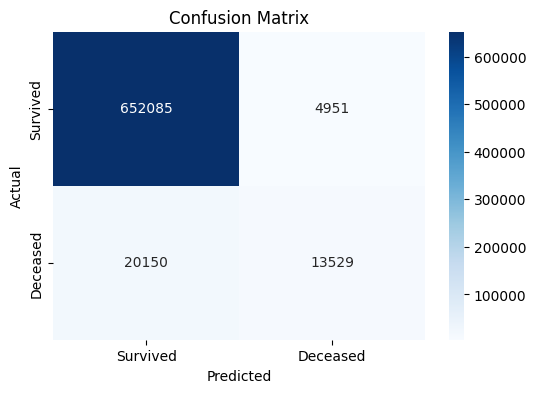

In [ ]:
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_fscore_support, confusion_matrix, accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModel, TrainingArguments, Trainer, AdamW
import matplotlib.pyplot as plt
import seaborn as sns
import os

# 10. Matrice di confusione
cm = confusion_matrix(val_labels, val_preds)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=["Survived", "Deceased"], yticklabels=["Survived", "Deceased"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

# Salva il grafico nella directory specificata
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati /3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, "confusion_matrix_terzo.png"))

plt.show()

#LEARINGC CURVES

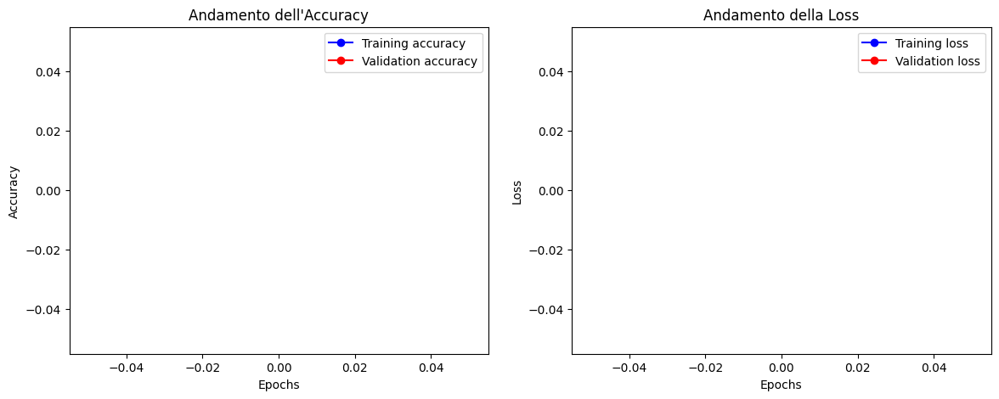

In [ ]:
import os
import matplotlib.pyplot as plt

def plot_learning_curves(training_logs, save_dir, file_prefix):
    # Estrai i valori della loss e dell'accuracy per ogni epoca
    train_loss = training_logs['train_loss']
    val_loss = training_logs['eval_loss']
    train_accuracy = training_logs['train_accuracy']
    val_accuracy = training_logs['eval_accuracy']

    # Assicurati che tutte le liste abbiano la stessa lunghezza
    min_length = min(len(train_loss), len(val_loss), len(train_accuracy), len(val_accuracy))
    train_loss = train_loss[:min_length]
    val_loss = val_loss[:min_length]
    train_accuracy = train_accuracy[:min_length]
    val_accuracy = val_accuracy[:min_length]

    epochs = range(1, len(train_loss) + 1)

    # Plot dell'andamento dell'accuracy
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_accuracy, 'bo-', label='Training accuracy')  # Linee per training accuracy
    plt.plot(epochs, val_accuracy, 'ro-', label='Validation accuracy')  # Linee per validation accuracy
    plt.title('Andamento dell\'Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot dell'andamento della loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_loss, 'bo-', label='Training loss')  # Linee per training loss
    plt.plot(epochs, val_loss, 'ro-', label='Validation loss')  # Linee per validation loss
    plt.title('Andamento della Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Salva i grafici nella directory specificata
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    plt.savefig(os.path.join(save_dir, f"{file_prefix}_learning_curves.png"))

    plt.show()

# Funzione per estrarre i log di addestramento
def extract_training_logs(trainer):
    train_log = trainer.state.log_history
    training_logs = {
        "train_loss": [entry["loss"] for entry in train_log if "loss" in entry],
        "eval_loss": [entry["eval_loss"] for entry in train_log if "eval_loss" in entry],
        "train_accuracy": [entry["accuracy"] for entry in train_log if "accuracy" in entry],
        "eval_accuracy": [entry["eval_accuracy"] for entry in train_log if "eval_accuracy" in entry],
    }
    return training_logs

# Percorso di salvataggio e prefisso del file
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati /3'
file_prefix = 'ROC_TERZO'

# Estrazione dei log di addestramento dal trainer
training_logs = extract_training_logs(trainer)

# Chiamata alla funzione per plottare e salvare le learning curves
plot_learning_curves(training_logs, save_dir, file_prefix)

#ROC

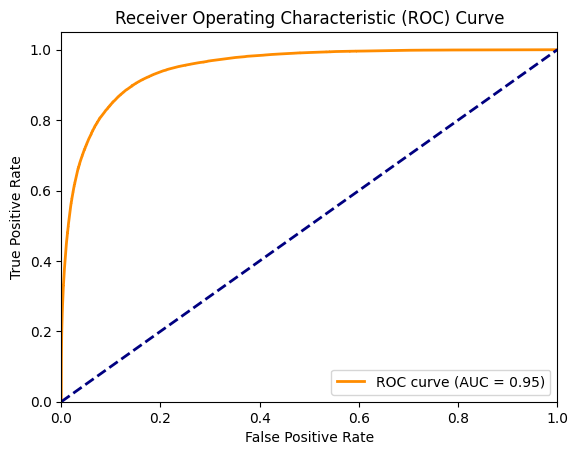

In [6]:
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_fscore_support, precision_recall_curve, average_precision_score, roc_curve, auc
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModel, TrainingArguments, Trainer, AdamW
import matplotlib.pyplot as plt
import os

# Funzione per plottare la ROC curve
def plot_roc_curve(y_true, y_pred, save_dir, file_prefix):
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    plt.savefig(os.path.join(save_dir, f"{file_prefix}_roc_curve.png"))
    plt.show()



# Percorso di salvataggio e prefisso del file
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati /3'
file_prefix = 'TERZO'

# Plot delle curve ROC e Precision-Recall
plot_roc_curve(val_labels, val_predictions.predictions[:, 1], save_dir, file_prefix)


#PRECISION VS RECALL

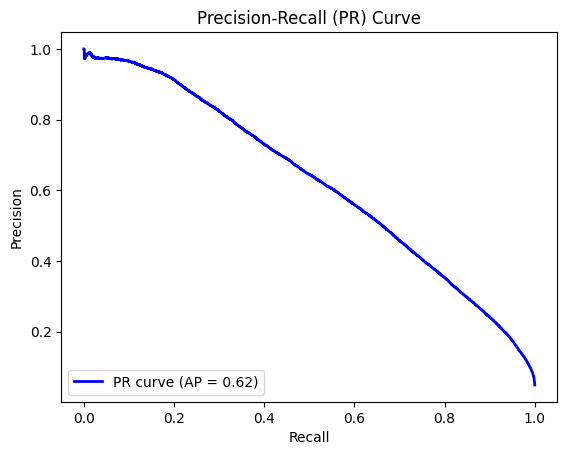

In [7]:
# Funzione per plottare la Precision-Recall curve
def plot_precision_recall_curve(y_true, y_pred, save_dir, file_prefix):
    precision, recall, _ = precision_recall_curve(y_true, y_pred)
    average_precision = average_precision_score(y_true, y_pred)

    plt.figure()
    plt.plot(recall, precision, color='b', lw=2, label=f'PR curve (AP = {average_precision:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall (PR) Curve')
    plt.legend(loc="lower left")

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    plt.savefig(os.path.join(save_dir, f"{file_prefix}_precision_recall_curve.png"))
    plt.show()

# Percorso di salvataggio e prefisso del file
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati /3'
file_prefix = 'TERZO'

plot_precision_recall_curve(val_labels, val_predictions.predictions[:, 1], save_dir, file_prefix)

#THRESOLD VS METRICS

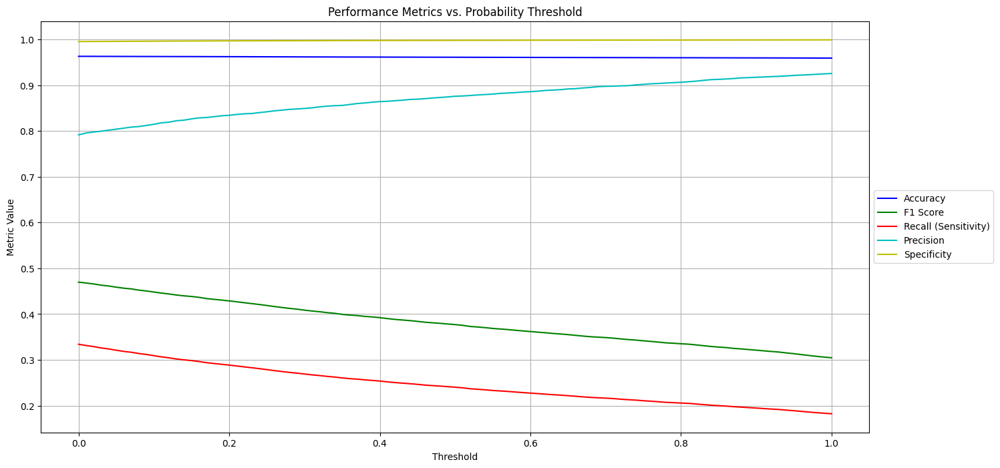

In [8]:
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_fscore_support, confusion_matrix, accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModel, TrainingArguments, Trainer, AdamW
import matplotlib.pyplot as plt
import os


# Funzione per calcolare sensitivity e specificity
def calculate_sensitivity_specificity(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = tp / (tp + fn)  # Sensitivity = Recall
    specificity = tn / (tn + fp)  # Specificity = True Negative Rate
    return sensitivity, specificity

# Funzione per plottare e salvare le metriche di performance
def plot_performance_metrics(y_true, y_pred_prob, save_dir, file_name):
    # Inizializzazione delle metriche per ogni threshold
    thresholds = np.linspace(0, 1, 101)
    accuracy = []
    f1_scores = []
    recalls = []
    precisions = []
    specificities = []

    # Calcoliamo le metriche per ogni threshold
    for threshold in thresholds:
        y_pred_bin = (y_pred_prob >= threshold).astype(int)

        # Calcolare precisione, recall, f1-score
        accuracy.append(accuracy_score(y_true, y_pred_bin))
        f1_scores.append(f1_score(y_true, y_pred_bin))
        recalls.append(recall_score(y_true, y_pred_bin))
        precisions.append(precision_score(y_true, y_pred_bin))

        # Calcolare sensitivity e specificity
        _, specificity = calculate_sensitivity_specificity(y_true, y_pred_bin)
        specificities.append(specificity)

    # Creazione del grafico
    plt.figure(figsize=(16, 8))

    plt.plot(thresholds, accuracy, label='Accuracy', color='b')
    plt.plot(thresholds, f1_scores, label='F1 Score', color='g')
    plt.plot(thresholds, recalls, label='Recall (Sensitivity)', color='r')
    plt.plot(thresholds, precisions, label='Precision', color='c')
    plt.plot(thresholds, specificities, label='Specificity', color='y')

    # Modifica posizione della legenda
    plt.xlabel('Threshold')
    plt.ylabel('Metric Value')
    plt.title('Performance Metrics vs. Probability Threshold')

    # Spostamento della legenda a destra nel centro
    plt.legend(loc='best', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

    # Salva i grafici nella directory specificata
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    plt.savefig(os.path.join(save_dir, file_name))

    plt.show()

# Percorso di salvataggio e nome del file
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati /3'
file_name = 'Performance_Metrics_Thresholds_terzo.png'

# Chiamata alla funzione per plottare e salvare le metriche di performance
plot_performance_metrics(val_labels, val_predictions.predictions[:, 1], save_dir, file_name)

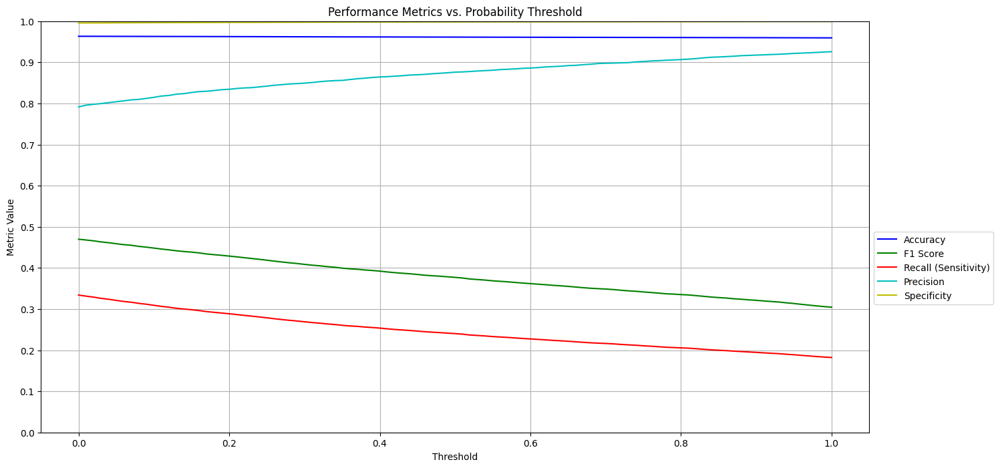

In [10]:
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_fscore_support, confusion_matrix, accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModel, TrainingArguments, Trainer, AdamW
import matplotlib.pyplot as plt
import os

# Funzione per calcolare sensitivity e specificity
def calculate_sensitivity_specificity(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = tp / (tp + fn)  # Sensitivity = Recall
    specificity = tn / (tn + fp)  # Specificity = True Negative Rate
    return sensitivity, specificity

# Funzione per plottare e salvare le metriche di performance
def plot_performance_metrics(y_true, y_pred_prob, save_dir, file_name):
    # Inizializzazione delle metriche per ogni threshold
    thresholds = np.linspace(0, 1, 101)
    accuracy = []
    f1_scores = []
    recalls = []
    precisions = []
    specificities = []

    # Calcoliamo le metriche per ogni threshold
    for threshold in thresholds:
        y_pred_bin = (y_pred_prob >= threshold).astype(int)

        # Calcolare precisione, recall, f1-score
        accuracy.append(accuracy_score(y_true, y_pred_bin))
        f1_scores.append(f1_score(y_true, y_pred_bin))
        recalls.append(recall_score(y_true, y_pred_bin))
        precisions.append(precision_score(y_true, y_pred_bin))

        # Calcolare sensitivity e specificity
        _, specificity = calculate_sensitivity_specificity(y_true, y_pred_bin)
        specificities.append(specificity)

    # Creazione del grafico
    plt.figure(figsize=(16, 8))

    plt.plot(thresholds, accuracy, label='Accuracy', color='b')
    plt.plot(thresholds, f1_scores, label='F1 Score', color='g')
    plt.plot(thresholds, recalls, label='Recall (Sensitivity)', color='r')
    plt.plot(thresholds, precisions, label='Precision', color='c')
    plt.plot(thresholds, specificities, label='Specificity', color='y')

    # Modifica posizione della legenda
    plt.xlabel('Threshold')
    plt.ylabel('Metric Value')
    plt.title('Performance Metrics vs. Probability Threshold')

    # Spostamento della legenda a destra nel centro
    plt.legend(loc='best', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

    # Imposta i limiti dell'asse y e i tick
    plt.ylim(0.0, 1.0)
    plt.yticks(np.arange(0, 1.1, 0.1))

    # Salva i grafici nella directory specificata
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    plt.savefig(os.path.join(save_dir, file_name))

    plt.show()

# Percorso di salvataggio e nome del file
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3'
file_name = 'Performance_Metrics_Thresholds_terzo.png'

# Chiamata alla funzione per plottare e salvare le metriche di performance
plot_performance_metrics(val_labels, val_predictions.predictions[:, 1], save_dir, file_name)

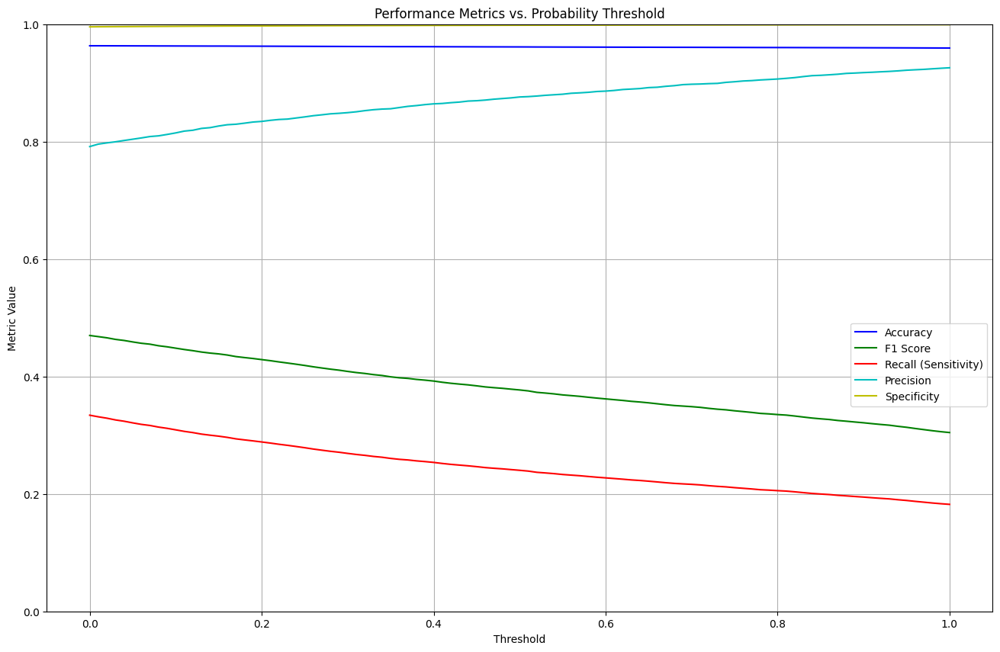

In [11]:
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_fscore_support, confusion_matrix, accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import train_test_split
from transformers import AutoTokenizer, AutoModel, TrainingArguments, Trainer, AdamW
import matplotlib.pyplot as plt
import os


# Funzione per calcolare sensitivity e specificity
def calculate_sensitivity_specificity(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = tp / (tp + fn)  # Sensitivity = Recall
    specificity = tn / (tn + fp)  # Specificity = True Negative Rate
    return sensitivity, specificity

# Funzione per plottare e salvare le metriche di performance
def plot_performance_metrics(y_true, y_pred_prob, save_dir, file_name):
    # Inizializzazione delle metriche per ogni threshold
    thresholds = np.linspace(0, 1, 101)
    accuracy = []
    f1_scores = []
    recalls = []
    precisions = []
    specificities = []

    # Calcoliamo le metriche per ogni threshold
    for threshold in thresholds:
        y_pred_bin = (y_pred_prob >= threshold).astype(int)

        # Calcolare precisione, recall, f1-score
        accuracy.append(accuracy_score(y_true, y_pred_bin))
        f1_scores.append(f1_score(y_true, y_pred_bin))
        recalls.append(recall_score(y_true, y_pred_bin))
        precisions.append(precision_score(y_true, y_pred_bin))

        # Calcolare sensitivity e specificity
        _, specificity = calculate_sensitivity_specificity(y_true, y_pred_bin)
        specificities.append(specificity)

    # Creazione del grafico
    plt.figure(figsize=(16, 10))

    plt.plot(thresholds, accuracy, label='Accuracy', color='b')
    plt.plot(thresholds, f1_scores, label='F1 Score', color='g')
    plt.plot(thresholds, recalls, label='Recall (Sensitivity)', color='r')
    plt.plot(thresholds, precisions, label='Precision', color='c')
    plt.plot(thresholds, specificities, label='Specificity', color='y')

    # Modifica posizione della legenda
    plt.xlabel('Threshold')
    plt.ylabel('Metric Value')
    plt.title('Performance Metrics vs. Probability Threshold')

    # Impostazione del range dell'asse delle ordinate
    plt.ylim(0.0, 1.0)

    # Spostamento della legenda a destra nel centro
    plt.legend(loc='best', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

    # Salva i grafici nella directory specificata
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    plt.savefig(os.path.join(save_dir, file_name))

    plt.show()

# Percorso di salvataggio e nome del file
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati /3'
file_name = 'Performance_Metrics_Thresholds_terzo.png'

# Chiamata alla funzione per plottare e salvare le metriche di performance
plot_performance_metrics(val_labels, val_predictions.predictions[:, 1], save_dir, file_name)

##XAI SU 336K


###SHAP

Tipi di grafici SHAP e loro interpretazione


1)Grafico a cascata (Waterfall Plot):
Descrizione: Il grafico a cascata mostra come ciascuna caratteristica (feature) contribuisce alla previsione del modello per una singola istanza (esempio specifico). Il grafico inizia con il valore di base (base value), che rappresenta la previsione media del modello, e aggiunge o sottrae i contributi delle caratteristiche per arrivare alla previsione finale.
Interpretazione: Ogni barra rappresenta il contributo di una caratteristica specifica. Se il contributo è positivo, la barra si sposta verso l'alto, aumentando la probabilità di previsione. Se il contributo è negativo, la barra si sposta verso il basso, diminuendo la probabilità di previsione. Questo grafico è utile per capire perché il modello ha fatto una certa previsione per un singolo paziente.

----------------

2)Grafico a barre della media assoluta dei valori SHAP
(Bar Plot for Mean Absolute SHAP Values):
Descrizione: Questo grafico mostra la media assoluta dei valori SHAP per ciascuna caratteristica su tutte le istanze. Le caratteristiche sono ordinate in base alla loro importanza media.
Interpretazione: Le caratteristiche con valori SHAP medi più alti sono quelle che hanno il maggiore impatto sulle previsioni del modello. Questo grafico è utile per identificare quali caratteristiche sono più influenti in generale nel modello.

----------------


3)Grafico a barre della somma assoluta dei valori SHAP
(Bar Plot for Sum of Absolute SHAP Values):
Descrizione: Questo grafico mostra la somma assoluta dei valori SHAP per ciascuna caratteristica su tutte le istanze. Le caratteristiche sono ordinate in base alla loro importanza totale.
Interpretazione: Simile al grafico precedente, ma mostra l'importanza totale piuttosto che la media. È utile per identificare quali caratteristiche hanno un impatto complessivo maggiore sulle previsioni del modello.

----------------

4)Grafico a barre della media assoluta dei valori SHAP ordinato
(Bar Plot for Mean Absolute SHAP Values Ordered):
Descrizione: Questo grafico mostra la media assoluta dei valori SHAP per ciascuna caratteristica, ordinata in base all'ordine crescente dei valori SHAP.
Interpretazione: Le caratteristiche con valori SHAP più piccoli sono meno influenti, mentre quelle con valori SHAP più grandi sono più influenti. Questo grafico è utile per visualizzare l'ordine delle caratteristiche in base alla loro importanza.

----------------

5)Grafico a barre della media assoluta dei valori SHAP ordinato inversamente
(Bar Plot for Mean Absolute SHAP Values Ordered Flip):
Descrizione: Questo grafico mostra la media assoluta dei valori SHAP per ciascuna caratteristica, ordinata in base all'ordine decrescente dei valori SHAP.
Interpretazione: Le caratteristiche con valori SHAP più grandi sono mostrate per prime, evidenziando le caratteristiche più influenti. Questo grafico è utile per visualizzare rapidamente le caratteristiche più importanti.

----------------

Come interpretare i risultati nel contesto della classificazione se un paziente è sopravvissuto o deceduto:
Caratteristiche più influenti: I grafici a barre (sia per la media che per la somma dei valori SHAP) mostrano quali caratteristiche sono più influenti nel determinare se un paziente è sopravvissuto o deceduto. Ad esempio, se la caratteristica "età" ha un valore SHAP medio molto alto, significa che l'età del paziente è una delle caratteristiche più importanti nel determinare la previsione del modello.

----------------


Contributi delle caratteristiche per una singola istanza: Il grafico a cascata mostra come ciascuna caratteristica specifica contribuisce alla previsione per un singolo paziente. Ad esempio, se la caratteristica "pressione sanguigna" ha un contributo negativo nel grafico a cascata, significa che una pressione sanguigna elevata diminuisce la probabilità che il modello preveda che il paziente sia sopravvissuto.

----------------


Ordine delle caratteristiche: I grafici a barre ordinati mostrano l'ordine delle caratteristiche in base alla loro importanza. Questo è utile per identificare rapidamente le caratteristiche più influenti e quelle meno influenti.


---------------




In sintesi, i grafici SHAP forniscono una comprensione dettagliata di come il modello utilizza le caratteristiche per fare previsioni. Questo è estremamente utile per interpretare le decisioni del modello e per identificare le caratteristiche chiave che influenzano le previsioni se un paziente è sopravvissuto o deceduto.


------------

Quali grafici sono più importanti per una visione globale?
Per un'analisi globale del rischio di morte, i grafici più utili sono:

Grafico a barre della media assoluta dei valori SHAP (per identificare le caratteristiche più influenti nel modello).
Grafico a cascata (per comprendere come ogni variabile contribuisce a un singolo caso e perché un paziente è a rischio).
Questi due grafici forniscono una visione completa sia globale (con le variabili più influenti) che locale (per il singolo paziente), aiutando a capire sia il quadro generale che le motivazioni dietro la classificazione di rischio di morte per ciascun individuo.

In sintesi, il grafico a cascata è perfetto per spiegare le previsioni del singolo paziente, mentre i grafici a barre per i valori medi assoluti dei valori SHAP (sia ordinati che non) offrono una visione globale utile per individuare i fattori di rischio più significativi nel modello.

In [ ]:
import numpy as np
import pandas as pd
import torch
import transformers
import shap
import scipy as sp

# Load your dataset (replace with your dataset loading method)
# df = pd.read_csv("your_dataset.csv")  # Uncomment and provide the correct path to your dataset

# Use cleaned_TEXT as the text variable and target as the target variable
text_data = df["DIAGNOSI"].tolist()
target_data = df["target"].tolist()

# Load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", num_labels=2).cuda()
labels = ["SURVIVOR", "DECEASED"]  # Assuming binary classification (0, 1)

# Define a function that processes text and outputs scores for each class
def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=140, truncation=True) for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores)
    return val

method = "custom tokenizer"

# Build an explainer using a custom tokenizer
if method == "custom tokenizer":
    import re

    def custom_tokenizer(s, return_offsets_mapping=True):
        """Custom tokenizers conform to a subset of the transformers API."""
        pos = 0
        offset_ranges = []
        input_ids = []
        for m in re.finditer(r"\W", s):
            start, end = m.span(0)
            offset_ranges.append((pos, start))
            input_ids.append(s[pos:start])
            pos = end
        if pos != len(s):
            offset_ranges.append((pos, len(s)))
            input_ids.append(s[pos:])
        out = {}
        out["input_ids"] = input_ids
        if return_offsets_mapping:
            out["offset_mapping"] = offset_ranges
        return out

    masker = shap.maskers.Text(custom_tokenizer)
    explainer = shap.Explainer(f, masker, output_names=labels)

# Compute SHAP values for the first few samples
shap_values = explainer(text_data[:20])

# Visualize the SHAP values
shap.plots.text(shap_values)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_Discharge_Summary_BERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
PartitionExplainer explainer: 21it [00:16,  1.82s/it]


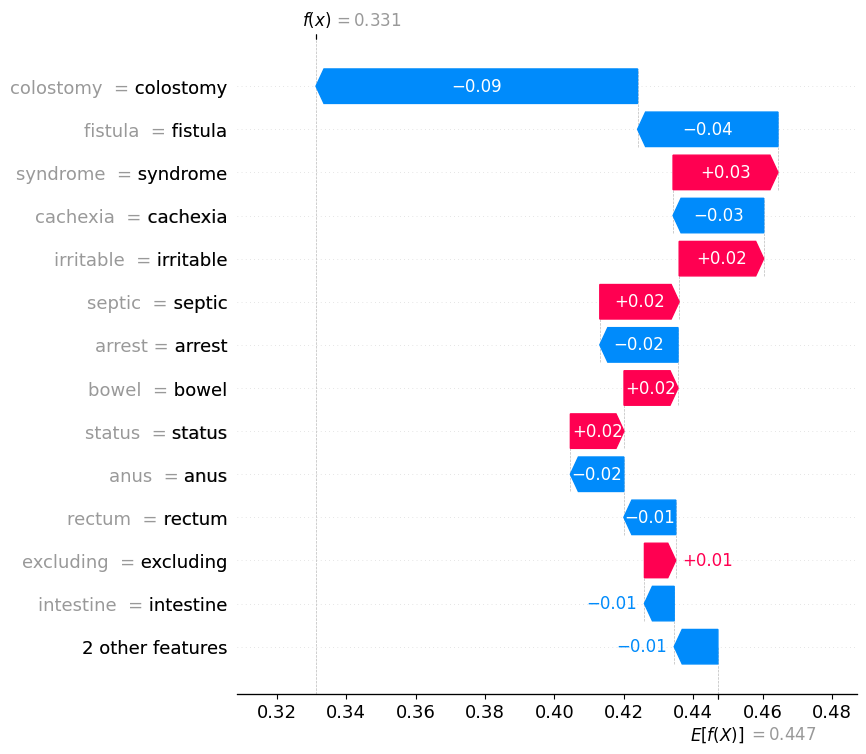

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import pandas as pd
import torch
import transformers
import shap
import scipy as sp
import matplotlib.pyplot as plt
import os

# Load your dataset (replace with your dataset loading method)
# df = pd.read_csv("your_dataset.csv")  # Uncomment and provide the correct path to your dataset

# Use cleaned_TEXT as the text variable and target as the target variable
text_data = df["DIAGNOSI"].tolist()
target_data = df["target"].tolist()

# Load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", num_labels=2).cuda()
labels = ["SURVIVOR", "DECEASED"]  # Assuming binary classification (0, 1)

# Define a function that processes text and outputs scores for each class
def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores)
    return val

method = "custom tokenizer"

# Build an explainer using a custom tokenizer
if method == "custom tokenizer":
    import re

    def custom_tokenizer(s, return_offsets_mapping=True):
        """Custom tokenizers conform to a subset of the transformers API."""
        pos = 0
        offset_ranges = []
        input_ids = []
        for m in re.finditer(r"\W", s):
            start, end = m.span(0)
            offset_ranges.append((pos, start))
            input_ids.append(s[pos:start])
            pos = end
        if pos != len(s):
            offset_ranges.append((pos, len(s)))
            input_ids.append(s[pos:])
        out = {}
        out["input_ids"] = input_ids
        if return_offsets_mapping:
            out["offset_mapping"] = offset_ranges
        return out

    masker = shap.maskers.Text(custom_tokenizer)
    explainer = shap.Explainer(f, masker, output_names=labels)

# Compute SHAP values for the first few samples
shap_values = explainer(text_data[:20])

# Visualize the SHAP values with a waterfall plot for a specific sample
sample_ind = 0  # Change this index to visualize different samples
shap_value_single = shap_values[sample_ind]
shap.plots.waterfall(shap_value_single[:, 1], max_display=14)  # Index [1] to select the class of interest

# Save the waterfall plot
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, 'shap_waterfall_explanation.png'))
plt.show()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_Discharge_Summary_BERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
PartitionExplainer explainer: 1001it [09:06,  1.81it/s]


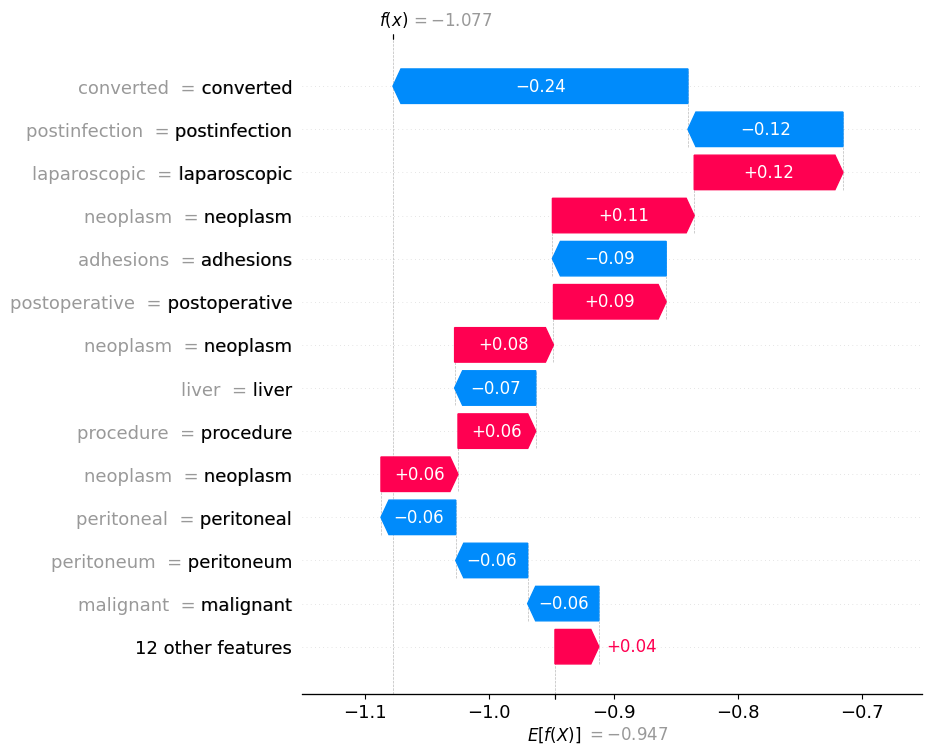

<Figure size 640x480 with 0 Axes>

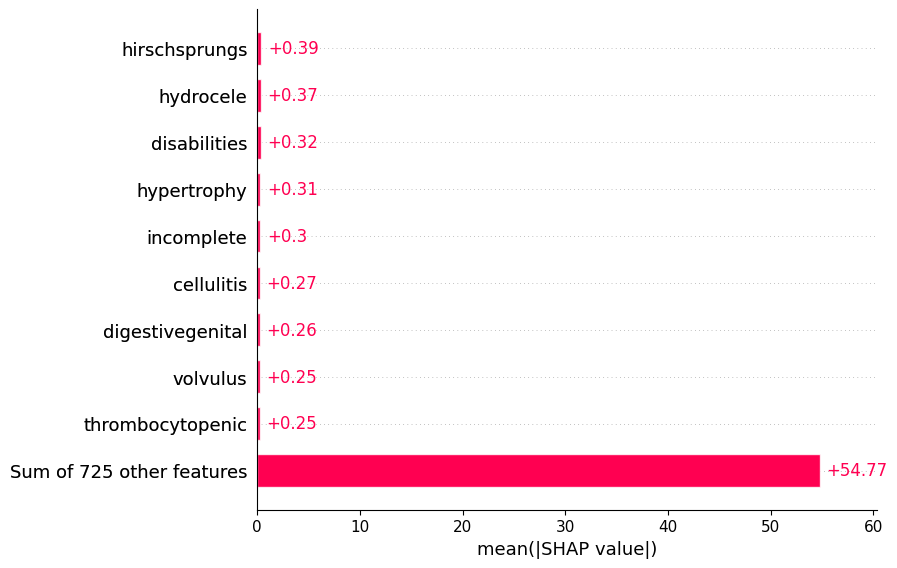

<Figure size 640x480 with 0 Axes>

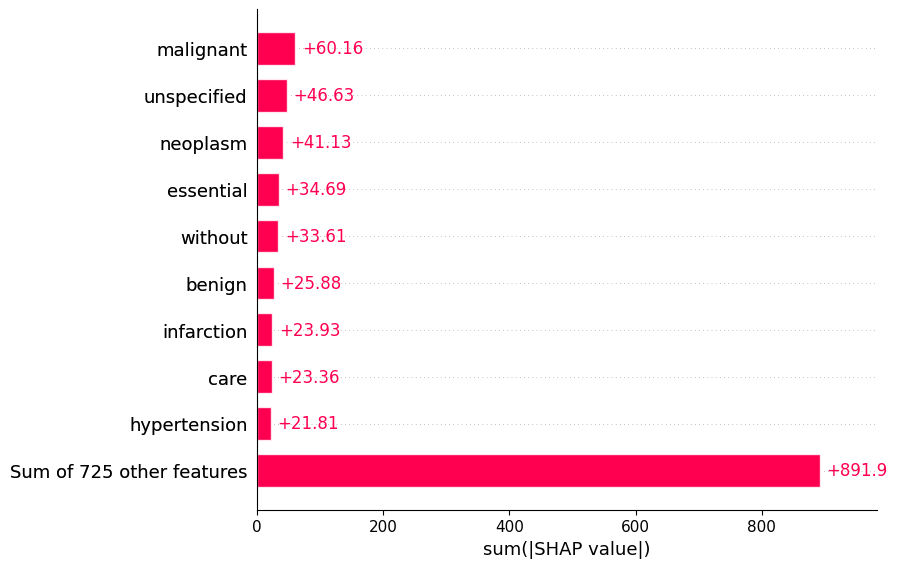

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import pandas as pd
import torch
import transformers
import shap
import scipy as sp
import matplotlib.pyplot as plt
import os

# Load your dataset (replace with your dataset loading method)
# df = pd.read_csv("your_dataset.csv")  # Uncomment and provide the correct path to your dataset

# Use cleaned_TEXT as the text variable and target as the target variable
text_data = df["DIAGNOSI"].tolist()
target_data = df["target"].tolist()

# Load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", num_labels=2).cuda()
labels = ["SURVIVOR", "DECEASED"]  # Assuming binary classification (0, 1)

# Define a function that processes text and outputs scores for each class
def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val

method = "custom tokenizer"

# Build an explainer using a custom tokenizer
if method == "custom tokenizer":
    import re

    def custom_tokenizer(s, return_offsets_mapping=True):
        """Custom tokenizers conform to a subset of the transformers API."""
        pos = 0
        offset_ranges = []
        input_ids = []
        for m in re.finditer(r"\W", s):
            start, end = m.span(0)
            offset_ranges.append((pos, start))
            input_ids.append(s[pos:start])
            pos = end
        if pos != len(s):
            offset_ranges.append((pos, len(s)))
            input_ids.append(s[pos:])
        out = {}
        out["input_ids"] = input_ids
        if return_offsets_mapping:
            out["offset_mapping"] = offset_ranges
        return out

    masker = shap.maskers.Text(custom_tokenizer)
    explainer = shap.Explainer(f, masker)

# Compute SHAP values for the first few samples
shap_values = explainer(text_data[:1000])

# Visualize the SHAP values with a waterfall plot for a specific sample
sample_ind = 789  # Change this index to visualize different samples
shap.plots.waterfall(shap_values[sample_ind], max_display=14)

# Save the waterfall plot
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, 'shap_waterfall_explanation2.png'))
plt.show()

# Plot the bar plot for mean absolute SHAP values
shap.plots.bar(shap_values.abs.mean(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_explanation2.png'))
plt.show()

# Plot the bar plot for the sum of absolute SHAP values
shap.plots.bar(shap_values.abs.sum(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_sum_explanation2.png'))
plt.show()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_Discharge_Summary_BERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
PartitionExplainer explainer: 3001it [26:46,  1.86it/s]


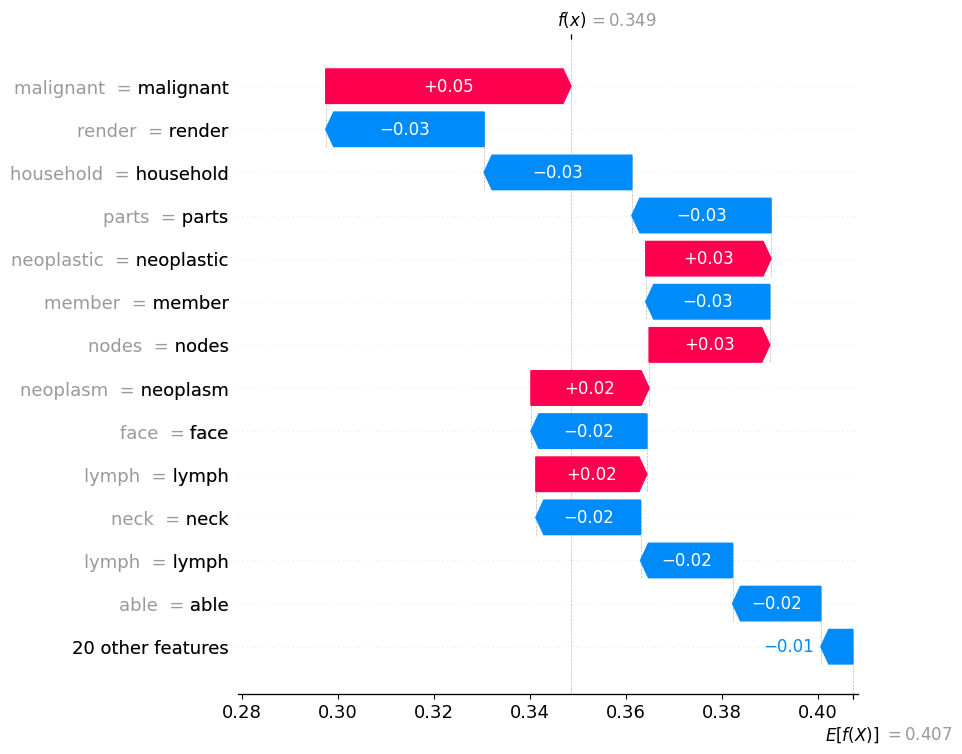

<Figure size 640x480 with 0 Axes>

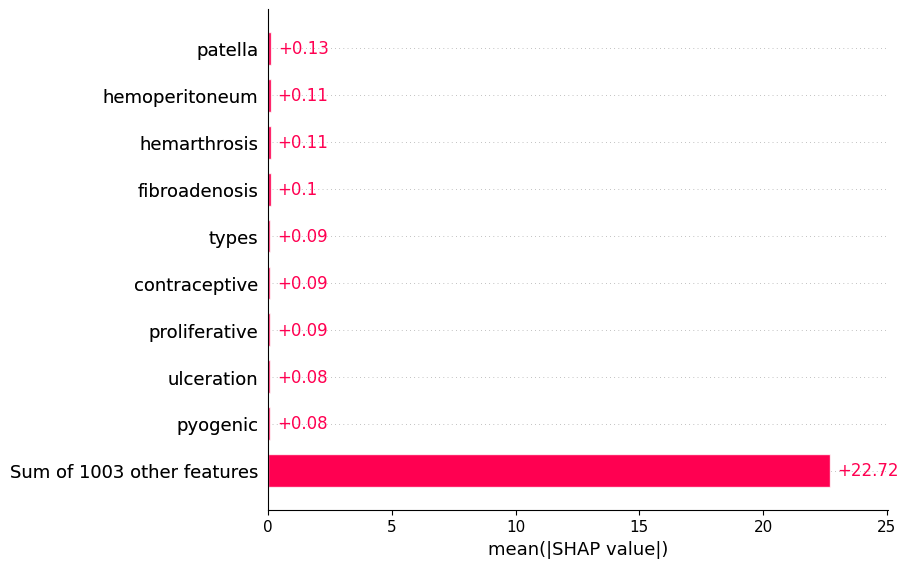

<Figure size 640x480 with 0 Axes>

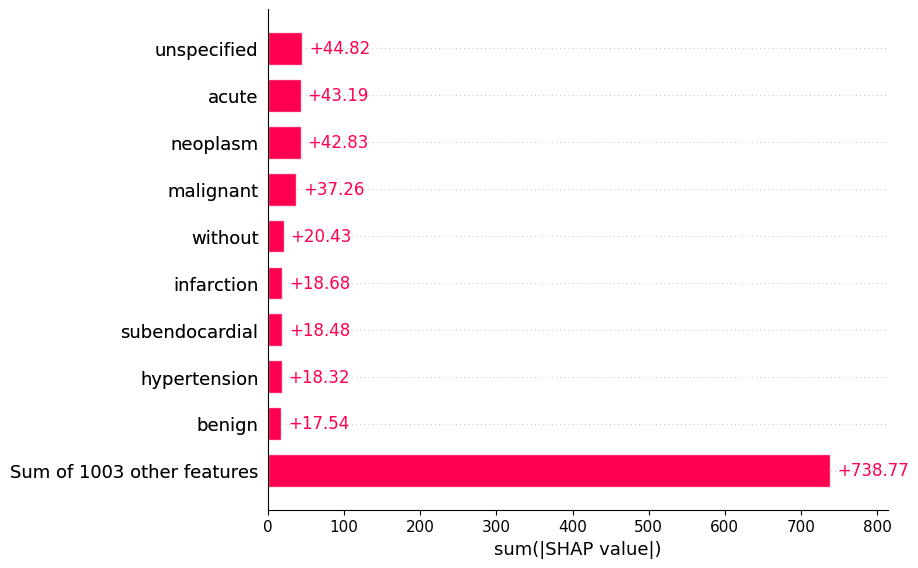

<Figure size 640x480 with 0 Axes>

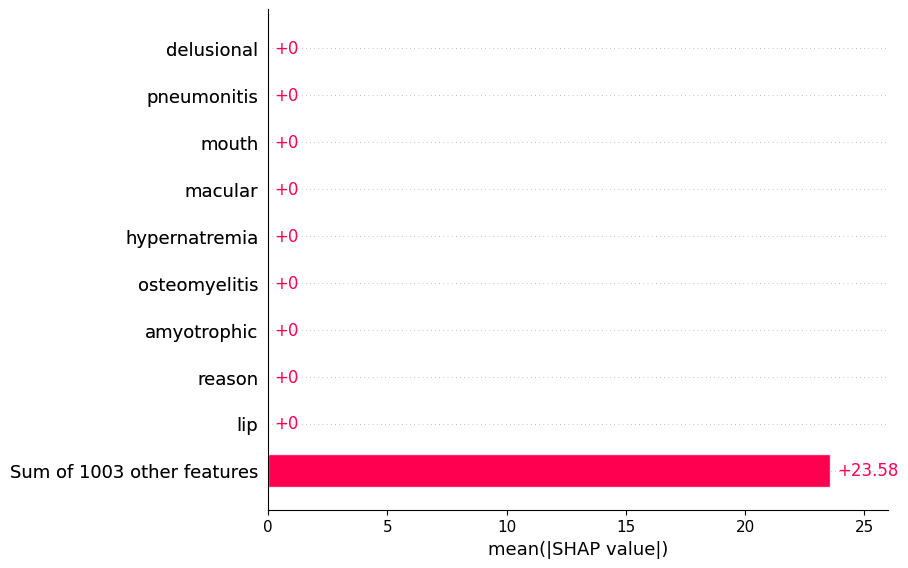

<Figure size 640x480 with 0 Axes>

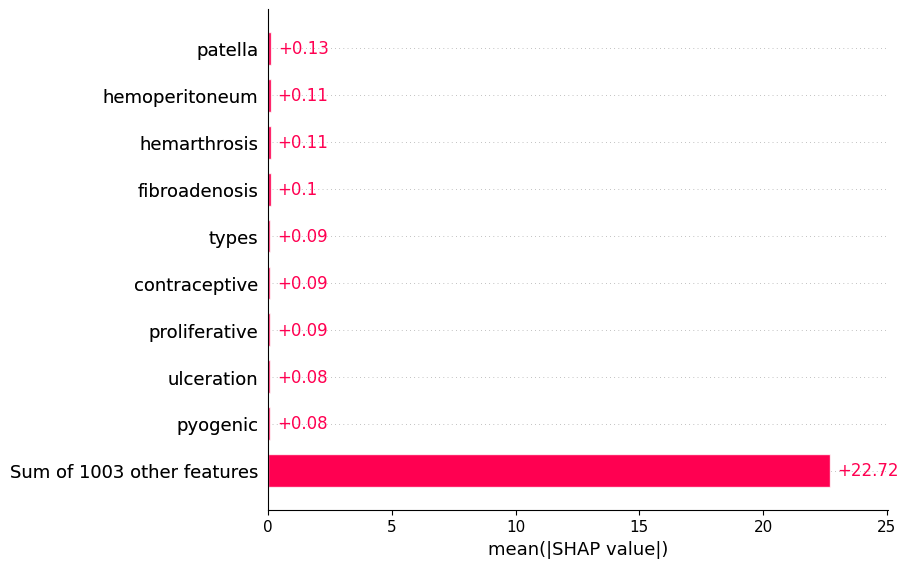

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import pandas as pd
import torch
import transformers
import shap
import scipy as sp
import matplotlib.pyplot as plt
import os

# Load your dataset (replace with your dataset loading method)
# df = pd.read_csv("your_dataset.csv")  # Uncomment and provide the correct path to your dataset

# Use cleaned_TEXT as the text variable and target as the target variable
text_data = df["DIAGNOSI"].tolist()
target_data = df["target"].tolist()

# Load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", num_labels=2).cuda()
labels = ["SURVIVOR", "DECEASED"]  # Assuming binary classification (0, 1)

# Define a function that processes text and outputs scores for each class
def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val

method = "custom tokenizer"

# Build an explainer using a custom tokenizer
if method == "custom tokenizer":
    import re

    def custom_tokenizer(s, return_offsets_mapping=True):
        """Custom tokenizers conform to a subset of the transformers API."""
        pos = 0
        offset_ranges = []
        input_ids = []
        for m in re.finditer(r"\W", s):
            start, end = m.span(0)
            offset_ranges.append((pos, start))
            input_ids.append(s[pos:start])
            pos = end
        if pos != len(s):
            offset_ranges.append((pos, len(s)))
            input_ids.append(s[pos:])
        out = {}
        out["input_ids"] = input_ids
        if return_offsets_mapping:
            out["offset_mapping"] = offset_ranges
        return out

    masker = shap.maskers.Text(custom_tokenizer)
    explainer = shap.Explainer(f, masker)

# Compute SHAP values for the first few samples
shap_values = explainer(text_data[:3000])

# Visualize the SHAP values with a waterfall plot for a specific sample
sample_ind = 586  # Change this index to visualize different samples
shap.plots.waterfall(shap_values[sample_ind], max_display=14)

# Save the waterfall plot
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, 'shap_waterfall_explanation3.png'))
plt.show()

# Plot the bar plot for mean absolute SHAP values
shap.plots.bar(shap_values.abs.mean(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_explanation3.png'))
plt.show()

# Plot the bar plot for the sum of absolute SHAP values
shap.plots.bar(shap_values.abs.sum(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_sum_explanation3.png'))
plt.show()

# Plot the bar plot for mean absolute SHAP values ordered by shap.Explanation.argsort
shap.plots.bar(shap_values.abs.mean(0), order=shap.Explanation.argsort)

# Save the bar plot ordered by shap.Explanation.argsort
plt.savefig(os.path.join(save_dir, 'shap_bar_ordered_explanation3.png'))
plt.show()

# Plot the bar plot for mean absolute SHAP values ordered by shap.Explanation.argsort.flip
shap.plots.bar(shap_values.abs.mean(0), order=shap.Explanation.argsort.flip)

# Save the bar plot ordered by shap.Explanation.argsort.flip
plt.savefig(os.path.join(save_dir, 'shap_bar_ordered_flip_explanation3.png'))
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import torch
import transformers
import shap
import scipy as sp
import matplotlib.pyplot as plt
import os
import re

# Load your dataset (replace with your dataset loading method)
# df = pd.read_csv("your_dataset.csv")  # Uncomment and provide the correct path to your dataset

# Use cleaned_TEXT as the text variable and target as the target variable
text_data = df["DIAGNOSI"].tolist()
target_data = df["target"].tolist()

# Load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", num_labels=2).cuda()
labels = ["SURVIVOR", "DECEASED"]  # Assuming binary classification (0, 1)

# Define a function that processes text and outputs scores for each class
def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val

# Custom tokenizer function
def custom_tokenizer(s, return_offsets_mapping=True):
    pos = 0
    offset_ranges = []
    input_ids = []
    for m in re.finditer(r"\W", s):
        start, end = m.span(0)
        offset_ranges.append((pos, start))
        input_ids.append(s[pos:start])
        pos = end
    if pos != len(s):
        offset_ranges.append((pos, len(s)))
        input_ids.append(s[pos:])
    out = {}
    out["input_ids"] = input_ids
    if return_offsets_mapping:
        out["offset_mapping"] = offset_ranges
    return out

# Build an explainer using a custom tokenizer
masker = shap.maskers.Text(custom_tokenizer)
explainer = shap.Explainer(f, masker)

# Compute model predictions for all samples
predictions = np.argmax(model(torch.tensor([
    tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in text_data
]).cuda())[0].detach().cpu().numpy(), axis=1)

# Find indices of true positive samples (predicted and actual 'DECEASED')
true_positives = [i for i, (pred, actual) in enumerate(zip(predictions, target_data)) if pred == 1 and actual == 1]

# Ensure there are true positive samples available
if not true_positives:
    raise ValueError("No true positive samples found (predicted and actual 'DECEASED').")

# Specify the index of the true positive sample to visualize
sample_ind = true_positives[0]  # Change this index to visualize different true positive samples

# Compute SHAP values for the selected true positive sample
shap_values = explainer([text_data[sample_ind]])

# Visualize the SHAP values with a waterfall plot for the specific sample
shap.plots.waterfall(shap_values[0], max_display=14)

# Save the waterfall plot
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, 'shap_waterfall_explanation4.png'))
plt.show()

# Plot the bar plot for mean absolute SHAP values
shap.plots.bar(shap_values.abs.mean(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_explanation4.png'))
plt.show()

# Plot the bar plot for the sum of absolute SHAP values
shap.plots.bar(shap_values.abs.sum(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_sum_explanation4.png'))
plt.show()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_Discharge_Summary_BERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.


OutOfMemoryError: CUDA out of memory. Tried to allocate 86.72 GiB. GPU 0 has a total capacity of 39.56 GiB of which 37.02 GiB is free. Process 2838 has 2.53 GiB memory in use. Of the allocated memory 1.86 GiB is allocated by PyTorch, and 175.40 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
import numpy as np
import pandas as pd
import torch
import transformers
import shap
import scipy as sp
import matplotlib.pyplot as plt
import os
import re

# Load your dataset (replace with your dataset loading method)
# df = pd.read_csv("your_dataset.csv")  # Uncomment and provide the correct path to your dataset

# Use cleaned_TEXT as the text variable and target as the target variable
text_data = df["DIAGNOSI"].tolist()
target_data = df["target"].tolist()

# Load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", num_labels=2).cuda()
labels = ["SURVIVOR", "DECEASED"]  # Assuming binary classification (0, 1)

# Define a function that processes text and outputs scores for each class
def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val

# Custom tokenizer function
def custom_tokenizer(s, return_offsets_mapping=True):
    pos = 0
    offset_ranges = []
    input_ids = []
    for m in re.finditer(r"\W", s):
        start, end = m.span(0)
        offset_ranges.append((pos, start))
        input_ids.append(s[pos:start])
        pos = end
    if pos != len(s):
        offset_ranges.append((pos, len(s)))
        input_ids.append(s[pos:])
    out = {}
    out["input_ids"] = input_ids
    if return_offsets_mapping:
        out["offset_mapping"] = offset_ranges
    return out

# Build an explainer using a custom tokenizer
masker = shap.maskers.Text(custom_tokenizer)
explainer = shap.Explainer(f, masker)

# Compute model predictions for all samples
predictions = np.argmax(model(torch.tensor([
    tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in text_data
]).cuda())[0].detach().cpu().numpy(), axis=1)

# Find indices of true positive samples (predicted and actual 'DECEASED')
true_positives = [i for i, (pred, actual) in enumerate(zip(predictions, target_data)) if pred == 1 and actual == 1]

# Ensure there are true positive samples available
if not true_positives:
    raise ValueError("No true positive samples found (predicted and actual 'DECEASED').")

# Specify the index of the true positive sample to visualize
sample_ind = true_positives[1963]  # Change this index to visualize different true positive samples

# Compute SHAP values for the selected true positive sample
shap_values = explainer([text_data[sample_ind]])

# Visualize the SHAP values with a waterfall plot for the specific sample
shap.plots.waterfall(shap_values[0], max_display=14)

# Save the waterfall plot
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, 'shap_waterfall_explanation5.png'))
plt.show()

# Plot the bar plot for mean absolute SHAP values
shap.plots.bar(shap_values.abs.mean(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_explanation5.png'))
plt.show()

# Plot the bar plot for the sum of absolute SHAP values
shap.plots.bar(shap_values.abs.sum(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_sum_explanation5.png'))
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import torch
import transformers
import shap
import scipy as sp
import matplotlib.pyplot as plt
import os
import re

# Load your dataset (replace with your dataset loading method)
# df = pd.read_csv("your_dataset.csv")  # Uncomment and provide the correct path to your dataset

# Use cleaned_TEXT as the text variable and target as the target variable
text_data = df["DIAGNOSI"].tolist()
target_data = df["target"].tolist()

# Load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", num_labels=2).cuda()
labels = ["SURVIVOR", "DECEASED"]  # Assuming binary classification (0, 1)

# Define a function that processes text and outputs scores for each class
def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val

# Custom tokenizer function
def custom_tokenizer(s, return_offsets_mapping=True):
    pos = 0
    offset_ranges = []
    input_ids = []
    for m in re.finditer(r"\W", s):
        start, end = m.span(0)
        offset_ranges.append((pos, start))
        input_ids.append(s[pos:start])
        pos = end
    if pos != len(s):
        offset_ranges.append((pos, len(s)))
        input_ids.append(s[pos:])
    out = {}
    out["input_ids"] = input_ids
    if return_offsets_mapping:
        out["offset_mapping"] = offset_ranges
    return out

# Build an explainer using a custom tokenizer
masker = shap.maskers.Text(custom_tokenizer)
explainer = shap.Explainer(f, masker)

# Compute model predictions for all samples
predictions = np.argmax(model(torch.tensor([
    tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in text_data
]).cuda())[0].detach().cpu().numpy(), axis=1)

# Find indices of true positive samples (predicted and actual 'DECEASED')
true_positives = [i for i, (pred, actual) in enumerate(zip(predictions, target_data)) if pred == 1 and actual == 1]

# Ensure there are true positive samples available
if not true_positives:
    raise ValueError("No true positive samples found (predicted and actual 'DECEASED').")

# Specify the index of the true positive sample to visualize
sample_ind = true_positives[1999]  # Change this index to visualize different true positive samples

# Compute SHAP values for the selected true positive sample
shap_values = explainer([text_data[sample_ind]])

# Visualize the SHAP values with a waterfall plot for the specific sample
shap.plots.waterfall(shap_values[0], max_display=14)

# Save the waterfall plot
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, 'shap_waterfall_explanation6.png'))
plt.show()

# Plot the bar plot for mean absolute SHAP values
shap.plots.bar(shap_values.abs.mean(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_explanation6.png'))
plt.show()

# Plot the bar plot for the sum of absolute SHAP values
shap.plots.bar(shap_values.abs.sum(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_sum_explanation6.png'))
plt.show()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_Discharge_Summary_BERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


OutOfMemoryError: CUDA out of memory. Tried to allocate 86.72 GiB. GPU 0 has a total capacity of 39.56 GiB of which 36.40 GiB is free. Process 2838 has 3.15 GiB memory in use. Of the allocated memory 2.49 GiB is allocated by PyTorch, and 167.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
import numpy as np
import pandas as pd
import torch
import transformers
import shap
import scipy as sp
import matplotlib.pyplot as plt
import os
import re

# Load your dataset (replace with your dataset loading method)
# df = pd.read_csv("your_dataset.csv")  # Uncomment and provide the correct path to your dataset

# Use cleaned_TEXT as the text variable and target as the target variable
text_data = df["DIAGNOSI"].tolist()
target_data = df["target"].tolist()

# Load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("emilyalsentzer/Bio_Discharge_Summary_BERT", num_labels=2).cuda()
labels = ["SURVIVOR", "DECEASED"]  # Assuming binary classification (0, 1)

# Define a function that processes text and outputs scores for each class
def f(x):
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in x
    ]).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val

# Custom tokenizer function
def custom_tokenizer(s, return_offsets_mapping=True):
    pos = 0
    offset_ranges = []
    input_ids = []
    for m in re.finditer(r"\W", s):
        start, end = m.span(0)
        offset_ranges.append((pos, start))
        input_ids.append(s[pos:start])
        pos = end
    if pos != len(s):
        offset_ranges.append((pos, len(s)))
        input_ids.append(s[pos:])
    out = {}
    out["input_ids"] = input_ids
    if return_offsets_mapping:
        out["offset_mapping"] = offset_ranges
    return out

# Build an explainer using a custom tokenizer
masker = shap.maskers.Text(custom_tokenizer)
explainer = shap.Explainer(f, masker)

# Compute model predictions for all samples
predictions = np.argmax(model(torch.tensor([
    tokenizer.encode(v, padding="max_length", max_length=90, truncation=True) for v in text_data
]).cuda())[0].detach().cpu().numpy(), axis=1)

# Find indices of true positive samples (predicted and actual 'DECEASED')
true_positives = [i for i, (pred, actual) in enumerate(zip(predictions, target_data)) if pred == 1 and actual == 1]

# Ensure there are true positive samples available
if not true_positives:
    raise ValueError("No true positive samples found (predicted and actual 'DECEASED').")

# Specify the index of the true positive sample to visualize
sample_ind = true_positives[1939]  # Change this index to visualize different true positive samples

# Compute SHAP values for the selected true positive sample
shap_values = explainer([text_data[sample_ind]])

# Visualize the SHAP values with a waterfall plot for the specific sample
shap.plots.waterfall(shap_values[0], max_display=14)

# Save the waterfall plot
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, 'shap_waterfall_explanation6.png'))
plt.show()

# Plot the bar plot for mean absolute SHAP values
shap.plots.bar(shap_values.abs.mean(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_explanation7.png'))
plt.show()

# Plot the bar plot for the sum of absolute SHAP values
shap.plots.bar(shap_values.abs.sum(0))

# Save the bar plot
plt.savefig(os.path.join(save_dir, 'shap_bar_sum_explanation7.png'))
plt.show()

###LIME

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 19.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=ce37c3878de11975b267e09a37d9b4b0c0b51c39cf2aaac67788ccb18568d252
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_Discharge_Summary_BERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
<ipython-input-23-6988c7a5289c>:90: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1,Auc
1,No log,0.536458,0.765000,0.769555,0.765000,0.764003,0.815950
2,No log,0.497690,0.790000,0.791868,0.790000,0.789663,0.812650
3,No log,0.488720,0.790000,0.791868,0.790000,0.789663,0.811350


Evaluation Results: {'eval_loss': 0.4976896643638611, 'eval_accuracy': 0.79, 'eval_precision': 0.7918679549114331, 'eval_recall': 0.79, 'eval_f1': 0.7896634615384616, 'eval_auc': 0.81265, 'eval_runtime': 21.1807, 'eval_samples_per_second': 9.443, 'eval_steps_per_second': 0.33, 'epoch': 3.0}
Classification Report:
              precision    recall  f1-score   support

    Survived       0.82      0.75      0.78       100
    Deceased       0.77      0.83      0.80       100

    accuracy                           0.79       200
   macro avg       0.79      0.79      0.79       200
weighted avg       0.79      0.79      0.79       200



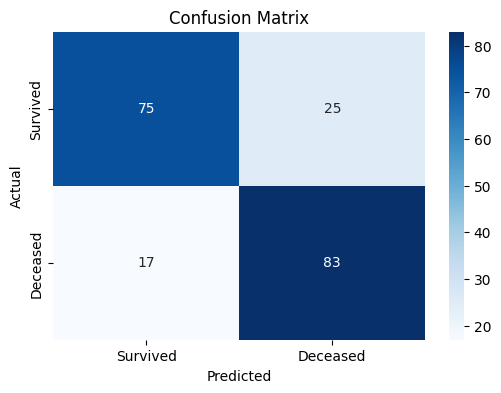

In [ ]:
import pandas as pd
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, roc_auc_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments, AdamW
import os

# 1. Configurazione del dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Dataset (sostituisci con il tuo dataset)
# Assumendo che `df` sia già caricato con colonne 'cleaned_TEXT' e 'target'
texts = df['DIAGNOSI'].astype(str).tolist()
labels = df['target'].astype(int).tolist()

# 3. Suddivisione del dataset
train_texts, val_texts, train_labels, val_labels = train_test_split(
    texts, labels, test_size=0.2, stratify=labels, random_state=42
)

# 4. Tokenizzazione con il modello pre-addestrato
model_name = "emilyalsentzer/Bio_Discharge_Summary_BERT"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize_function(texts):
    return tokenizer(
        texts, padding="max_length", truncation=True, max_length=140, return_tensors="pt"
    )

train_encodings = tokenize_function(train_texts)
val_encodings = tokenize_function(val_texts)

# 5. Creazione del dataset personalizzato
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

train_dataset = CustomDataset(train_encodings, train_labels)
val_dataset = CustomDataset(val_encodings, val_labels)

# 6. Caricamento del modello
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2)
model.to(device)

# 7. Configurazione del Trainer
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=1e-5,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    num_train_epochs=1,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_steps=100,
    save_strategy="epoch",
    save_total_limit=2,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    report_to="none"
)

# Funzione per calcolare le metriche di valutazione
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average="weighted")
    acc = accuracy_score(labels, preds)
    auc = roc_auc_score(labels, logits[:, 1])
    return {
        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "auc": auc
    }

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

# 8. Training e valutazione
trainer.train()
eval_results = trainer.evaluate()
print("Evaluation Results:", eval_results)

# 9. Generazione del report finale
val_predictions = trainer.predict(val_dataset)
preds = np.argmax(val_predictions.predictions, axis=1)
print("Classification Report:")
print(classification_report(val_labels, preds, target_names=["Survived", "Deceased"]))

# 10. Matrice di confusione
cm = confusion_matrix(val_labels, preds)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=["Survived", "Deceased"], yticklabels=["Survived", "Deceased"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

# Salva il grafico nella directory specificata
save_dir = '/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati /3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
plt.savefig(os.path.join(save_dir, "confusion_matrix_terzo.png"))

plt.show()

In [ ]:
# Explainable AI Libraries
from lime.lime_text import LimeTextExplainer

# Define class names
class_names = ['survived ', 'Deceased']

# Initialize LIME explainer
explainer = LimeTextExplainer(class_names=class_names)

def predict_proba(texts):
    # Tokenize the texts
    encodings = tokenizer(
        texts,
        padding=True,
        truncation=True,
        max_length=140,
        return_tensors='pt'
    )
    # Move tensors to the same device as the model
    encodings = {key: val.to(model.device) for key, val in encodings.items()}

    # Get logits from the model
    with torch.no_grad():
        outputs = model(**encodings)
        logits = outputs.logits
        probs = torch.softmax(logits, dim=1).cpu().numpy()
    return probs




In [ ]:
import os
import matplotlib.pyplot as plt

# Seleziona tre campioni dal set di test che sono previsti come classe 1
selected_samples = []
for sample_idx in range(len(val_texts)):
    if val_preds[sample_idx] == 1:
        sample_text = val_texts[sample_idx]
        actual_sentiment = val_labels[sample_idx]
        predicted_sentiment = val_preds[sample_idx]
        selected_samples.append((sample_text, actual_sentiment, predicted_sentiment))
        if len(selected_samples) == 10:
            break

# Assicurati che siano stati trovati tre campioni validi
if len(selected_samples) < 10:
    raise ValueError("Non sono state trovate tre osservazioni previste come classe 1 nel set di test.")

for i, (sample_text, actual_sentiment, predicted_sentiment) in enumerate(selected_samples):
    # Stampa il testo pulito e i dati del sentiment
    print(f"Osservazione {i+1}")
    print(f"Testo Pulito: {sample_text}")
    print(f"Classe Reale: {class_names[actual_sentiment]}")
    print(f"Classe Prevista: {class_names[predicted_sentiment]}")

    # Genera una spiegazione
    exp = explainer.explain_instance(
        sample_text,
        predict_proba,
        num_features=7,
        labels=[predicted_sentiment]
    )

    # Mostra la spiegazione
    exp.show_in_notebook(text=True)

    # Genera una figura matplotlib dalla spiegazione LIME
    fig = exp.as_pyplot_figure()

    # Imposta la dimensione desiderata della figura (larghezza, altezza in pollici)
    fig.set_size_inches(16, 8)  # Ad esempio, 16 pollici di larghezza e 8 pollici di altezza

    # Definisci il percorso per il salvataggio dell'immagine PNG con il nome "LIME_VP_{i+1}.png"
    plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
    if not os.path.exists(plot_dir):
        os.makedirs(plot_dir)

    plot_path = os.path.join(plot_dir, f"LIME_vVP_{i+1}.png")

    # Salva la figura in formato PNG con DPI elevato per una migliore qualità
    fig.savefig(plot_path, format='png', dpi=600)

    plt.close(fig)

    print(f"Spiegazione della osservazione {i+1} salvata in {plot_path}")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Select a sample from the test set that is predicted as class 1
for sample_idx in range(len(val_texts)):
    if preds[sample_idx] == 1:
        sample_text = val_texts[sample_idx]
        actual_sentiment = val_labels[sample_idx]
        predicted_sentiment = preds[sample_idx]
        break

# Ensure a valid sample is found
if predicted_sentiment != 1:
    raise ValueError("No observations predicted as class 1 were found in the test set.")

# Print cleaned text and sentiment data
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Save the explanation as a plot in the specified directory
plot_path = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/explanation_plot_LIME_DECEASED_DECEASED2.png"
exp.save_to_file(plot_path)

print(f"Explanation plot saved to {plot_path}")


NameError: name 'preds' is not defined

In [ ]:
# Select a sample from the test set that is predicted as class 1
for sample_idx in range(len(val_texts)):
    if val_preds[sample_idx] == 1:
        sample_text = val_texts[sample_idx]
        actual_sentiment = val_labels[sample_idx]
        predicted_sentiment = val_preds[sample_idx]
        break

# Ensure a valid sample is found
if predicted_sentiment != 1:
    raise ValueError("No observations predicted as class 1 were found in the test set.")

# Print cleaned text and sentiment data
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Genera una figura matplotlib dalla spiegazione LIME
fig = exp.as_pyplot_figure()

# Imposta la dimensione desiderata della figura (larghezza, altezza in pollici)
fig.set_size_inches(16, 8)  # Ad esempio, 12 pollici di larghezza e 8 pollici di altezza

# Definisci il percorso per il salvataggio dell'immagine PNG con il nome "LIME_VP.png"
plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

plot_path = os.path.join(plot_dir, "LIME_VP2.png")

# Salva la figura in formato PNG con DPI elevato per una migliore qualità
fig.savefig(plot_path, format='png', dpi=600)

plt.close(fig)

print(f"Explanation plot saved to {plot_path}")


Cleaned Text: malignant neoplasm breast female unspecified malignant neoplasm liver secondary secondary malignant neoplasm bone bone marrow jaundice unspecified newborn cachexia
Actual CLASS: Deceased
Predicted CLASS: Deceased


Explanation plot saved to /content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/LIME_VP2.png


In [ ]:
import os
import matplotlib.pyplot as plt

# Select a sample from the test set
sample_idx = 42  # You can change this index to explore different samples
sample_text = val_texts[sample_idx]  # Use the index directly to access the list
actual_sentiment = val_labels[sample_idx]  # Use the index directly to access the list
predicted_sentiment = val_preds[sample_idx]  # Use the index directly to access the list

# Print original, cleaned, and sentiment data
#print(f"Original Text: {df.iloc[X_test.index[sample_idx]]['text']}")  # Access 'text' column from the full df
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Save the explanation as a plot in the specified directory
# Generate a matplotlib figure from the LIME explanation
fig = exp.as_pyplot_figure(label=predicted_sentiment)  # Specify the label parameter

# Set the desired figure size (width, height in inches)
fig.set_size_inches(16, 8)  # For example, 16 inches wide and 8 inches tall

# Define the path for saving the PNG image with the name "LIME_VP3.png"
plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

plot_path = os.path.join(plot_dir, "LIME_VP3.png")

# Save the figure in PNG format with high DPI for better quality
fig.savefig(plot_path, format='png', dpi=600)

plt.close(fig)

print(f"Explanation plot saved to {plot_path}")

Cleaned Text: malignant neoplasm sigmoid colon benign essential hypertension diabetes mellitus without mention complication type ii unspecified type stated uncontrolled
Actual CLASS: survived 
Predicted CLASS: survived 


Explanation plot saved to /content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/LIME_VP3.png


In [ ]:
import os
import matplotlib.pyplot as plt

# Select a sample from the test set
sample_idx = 1999  # You can change this index to explore different samples
sample_text = val_texts[sample_idx]  # Use the index directly to access the list
actual_sentiment = val_labels[sample_idx]  # Use the index directly to access the list
predicted_sentiment = val_preds[sample_idx]  # Use the index directly to access the list

# Print original, cleaned, and sentiment data
#print(f"Original Text: {df.iloc[X_test.index[sample_idx]]['text']}")  # Access 'text' column from the full df
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Save the explanation as a plot in the specified directory
# Generate a matplotlib figure from the LIME explanation
fig = exp.as_pyplot_figure(label=predicted_sentiment)  # Specify the label parameter

# Set the desired figure size (width, height in inches)
fig.set_size_inches(16, 8)  # For example, 16 inches wide and 8 inches tall

# Define the path for saving the PNG image with the name "LIME_VP3.png"
plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

plot_path = os.path.join(plot_dir, "LIME_VP4.png")

# Save the figure in PNG format with high DPI for better quality
fig.savefig(plot_path, format='png', dpi=600)

plt.close(fig)

print(f"Explanation plot saved to {plot_path}")

Cleaned Text: malignant neoplasm upper lobe bronchus lung
Actual CLASS: survived 
Predicted CLASS: survived 


Explanation plot saved to /content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/LIME_VP4.png


In [ ]:
import os
import matplotlib.pyplot as plt

# Select a sample from the test set
sample_idx = 1998  # You can change this index to explore different samples
sample_text = val_texts[sample_idx]  # Use the index directly to access the list
actual_sentiment = val_labels[sample_idx]  # Use the index directly to access the list
predicted_sentiment = val_preds[sample_idx]  # Use the index directly to access the list

# Print original, cleaned, and sentiment data
#print(f"Original Text: {df.iloc[X_test.index[sample_idx]]['text']}")  # Access 'text' column from the full df
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Save the explanation as a plot in the specified directory
# Generate a matplotlib figure from the LIME explanation
fig = exp.as_pyplot_figure(label=predicted_sentiment)  # Specify the label parameter

# Set the desired figure size (width, height in inches)
fig.set_size_inches(16, 8)  # For example, 16 inches wide and 8 inches tall

# Define the path for saving the PNG image with the name "LIME_VP3.png"
plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

plot_path = os.path.join(plot_dir, "LIME_VP5.png")

# Save the figure in PNG format with high DPI for better quality
fig.savefig(plot_path, format='png', dpi=600)

plt.close(fig)

print(f"Explanation plot saved to {plot_path}")

Cleaned Text: acute subacute forms ischemic heart disease coronary atherosclerosis native coronary artery right bundle branch block left anterior fascicular block unspecified essential hypertension chronic kidney disease stage ii mild
Actual CLASS: survived 
Predicted CLASS: survived 


Explanation plot saved to /content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/LIME_VP5.png


In [ ]:
import os
import matplotlib.pyplot as plt

# Select a sample from the test set
sample_idx = 30000  # You can change this index to explore different samples
sample_text = val_texts[sample_idx]  # Use the index directly to access the list
actual_sentiment = val_labels[sample_idx]  # Use the index directly to access the list
predicted_sentiment = val_preds[sample_idx]  # Use the index directly to access the list

# Print original, cleaned, and sentiment data
#print(f"Original Text: {df.iloc[X_test.index[sample_idx]]['text']}")  # Access 'text' column from the full df
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Save the explanation as a plot in the specified directory
# Generate a matplotlib figure from the LIME explanation
fig = exp.as_pyplot_figure(label=predicted_sentiment)  # Specify the label parameter

# Set the desired figure size (width, height in inches)
fig.set_size_inches(16, 8)  # For example, 16 inches wide and 8 inches tall

# Define the path for saving the PNG image with the name "LIME_VP3.png"
plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

plot_path = os.path.join(plot_dir, "LIME_VP6.png")

# Save the figure in PNG format with high DPI for better quality
fig.savefig(plot_path, format='png', dpi=600)

plt.close(fig)

print(f"Explanation plot saved to {plot_path}")

Cleaned Text: osteoarthrosis localized primary pelvic region thigh
Actual CLASS: survived 
Predicted CLASS: survived 


Explanation plot saved to /content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/LIME_VP6.png


In [ ]:
import os
import matplotlib.pyplot as plt

# Select a sample from the test set
sample_idx = 35000  # You can change this index to explore different samples
sample_text = val_texts[sample_idx]  # Use the index directly to access the list
actual_sentiment = val_labels[sample_idx]  # Use the index directly to access the list
predicted_sentiment = val_preds[sample_idx]  # Use the index directly to access the list

# Print original, cleaned, and sentiment data
#print(f"Original Text: {df.iloc[X_test.index[sample_idx]]['text']}")  # Access 'text' column from the full df
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Save the explanation as a plot in the specified directory
# Generate a matplotlib figure from the LIME explanation
fig = exp.as_pyplot_figure(label=predicted_sentiment)  # Specify the label parameter

# Set the desired figure size (width, height in inches)
fig.set_size_inches(16, 8)  # For example, 16 inches wide and 8 inches tall

# Define the path for saving the PNG image with the name "LIME_VP3.png"
plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

plot_path = os.path.join(plot_dir, "LIME_VP7.png")

# Save the figure in PNG format with high DPI for better quality
fig.savefig(plot_path, format='png', dpi=600)

plt.close(fig)

print(f"Explanation plot saved to {plot_path}")

Cleaned Text: malignant neoplasm prostate
Actual CLASS: survived 
Predicted CLASS: survived 


Explanation plot saved to /content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/LIME_VP7.png


In [ ]:
import os
import matplotlib.pyplot as plt

# Select a sample from the test set
sample_idx = 79623  # You can change this index to explore different samples
sample_text = val_texts[sample_idx]  # Use the index directly to access the list
actual_sentiment = val_labels[sample_idx]  # Use the index directly to access the list
predicted_sentiment = val_preds[sample_idx]  # Use the index directly to access the list

# Print original, cleaned, and sentiment data
#print(f"Original Text: {df.iloc[X_test.index[sample_idx]]['text']}")  # Access 'text' column from the full df
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Save the explanation as a plot in the specified directory
# Generate a matplotlib figure from the LIME explanation
fig = exp.as_pyplot_figure(label=predicted_sentiment)  # Specify the label parameter

# Set the desired figure size (width, height in inches)
fig.set_size_inches(16, 8)  # For example, 16 inches wide and 8 inches tall

# Define the path for saving the PNG image with the name "LIME_VP3.png"
plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

plot_path = os.path.join(plot_dir, "LIME_VP8.png")

# Save the figure in PNG format with high DPI for better quality
fig.savefig(plot_path, format='png', dpi=600)

plt.close(fig)

print(f"Explanation plot saved to {plot_path}")

Cleaned Text: malignant neoplasm ascending colon secondary unspecified malignant neoplasm intraabdominal lymph nodes secondary malignant neoplasm retroperitoneum peritoneum malignant neoplasm liver secondary atrial fibrillation
Actual CLASS: survived 
Predicted CLASS: survived 


Explanation plot saved to /content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/LIME_VP8.png


In [ ]:
import os
import matplotlib.pyplot as plt

# Select a sample from the test set
sample_idx = 2347 # You can change this index to explore different samples
sample_text = val_texts[sample_idx]  # Use the index directly to access the list
actual_sentiment = val_labels[sample_idx]  # Use the index directly to access the list
predicted_sentiment = val_preds[sample_idx]  # Use the index directly to access the list

# Print original, cleaned, and sentiment data
#print(f"Original Text: {df.iloc[X_test.index[sample_idx]]['text']}")  # Access 'text' column from the full df
print(f"Cleaned Text: {sample_text}")
print(f"Actual CLASS: {class_names[actual_sentiment]}")
print(f"Predicted CLASS: {class_names[predicted_sentiment]}")

# Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=7,
    labels=[predicted_sentiment]
)

# Display the explanation
exp.show_in_notebook(text=True)

# Save the explanation as a plot in the specified directory
# Generate a matplotlib figure from the LIME explanation
fig = exp.as_pyplot_figure(label=predicted_sentiment)  # Specify the label parameter

# Set the desired figure size (width, height in inches)
fig.set_size_inches(16, 8)  # For example, 16 inches wide and 8 inches tall

# Define the path for saving the PNG image with the name "LIME_VP3.png"
plot_dir = "/content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

plot_path = os.path.join(plot_dir, "LIME_VP9.png")

# Save the figure in PNG format with high DPI for better quality
fig.savefig(plot_path, format='png', dpi=600)

plt.close(fig)

print(f"Explanation plot saved to {plot_path}")

Cleaned Text: secondary unspecified malignant neoplasm lymph nodes multiple sites malignant neoplasm liver secondary secondary malignant neoplasm lung malignant neoplasm parts bronchus lung unspecified chronic bronchitis unspecified essential hypertension
Actual CLASS: survived 
Predicted CLASS: survived 


Explanation plot saved to /content/drive/MyDrive/Colab Notebooks/PERCORSO_ELIXHAUSER/TESI ELIXHAUSER/risultati/3/LIME_VP9.png
